# 11-14.프로젝트 : CIFAR-10 이미지 생성하기


GAN을 학습 시 고려해야 할 사항들  
- 모델 구조, 
- learning_rate, 
- 파라미터 초기화, 
- 생성자와 판별자의 경쟁 관계, 
- 데이터의 특성 등

이번에는 앞에서 배운 FASHION-MNIST 데이터 생성용 DCGAN 모델구조를 이용해서 CIFAR-10 데이터를 생성하는 모델을 직접 만들어 봅시다.  
<br>
      

    
*몇 가지 달라지는 점이 있습니다.*

- 이미지 데이터의 shape가 (28, 28, 1)에서 (32, 32, 3)으로 변경됩니다.  
생성자, 판별자 모델의 입출력 shape 및 모델 구조에 영향이 있습니다.
- 이미지가 단색의 grayscale에서 RGB 3채널의 컬러이미지로 변경됩니다.  
시각화 과정에서 고려할 점이 있습니다.
- 입력데이터 전체 차원이 3~4배 증가하면서, 학습이 진행되는 양상이 다소 달라집니다.  
우선 주요 라이브러리 버전을 확인하고 진행합시다.

#### import

In [13]:
import os
import glob
import time

import PIL
import imageio
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.python.ops.numpy_ops import np_config
from tensorflow.keras import layers
from keras.initializers import RandomNormal
from IPython import display
import matplotlib.pyplot as plt
from matplotlib.pylab import rcParams


%matplotlib inline

import warnings
warnings.filterwarnings( 'ignore' )

print("tensorflow", tf.__version__)

tensorflow 2.9.2


#### 상수정의

In [3]:
BUFFER_SIZE = 50000        # 데이터셋 개수
BATCH_SIZE = 100          # 랜덤 배치 개수

#### 함수정의

In [4]:
def load_data(label=None):
    '''한 레이블의 데이터만 받아오는 함수
    한 클래스만을 그려보기 위한 데이터 선택 함수'''

    (train_x, train_y), (test_x, test_y) = tf.keras.datasets.cifar10.load_data()
    if label:
        df = pd.DataFrame(list(zip(train_x, train_y)), columns=['image', 'label']) 
        df = df[df['label']==label]
        train_x = np.array([i for i in list(df['image'])])
        df = pd.DataFrame(list(zip(test_x, test_y)), columns =['image', 'label']) 
        df = df[df['label']==label]
        test_x = np.array([i for i in list(df['image'])])
    return train_x, test_x


def make_generator_model():
    '''생성자, generator 모델
    노드에서 주어진 기본 모델 (fasion에 사용된 모델)'''

    # Start
    model = tf.keras.Sequential()

    # Dense layer
    model.add(layers.Dense(8*8*256, use_bias=False, input_shape=(100,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    # Reshape layer
    model.add(layers.Reshape((8, 8, 256)))

    # Conv2DTranspose layer
    model.add(layers.Conv2DTranspose(128, kernel_size=(5, 5), strides=(1, 1), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    # Conv2DTranspose layer
    model.add(layers.Conv2DTranspose(64, kernel_size=(5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    # Conv2DTranspose layer
    model.add(layers.Conv2DTranspose(3, kernel_size=(5, 5), strides=(2, 2), padding='same', use_bias=False, \
                                     activation='tanh'))

    return model


def make_discriminator_model():
    '''판별자, discriminator 모델
    노드에서 주어진 기본 모델 (fasion에 사용된 모델)'''

    # Start
    model = tf.keras.Sequential()

    # Conv2D Layer
    model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=[32, 32, 3]))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    # Conv2D Layer
    model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    # Flatten Layer
    model.add(layers.Flatten())

    # Dense Layer
    model.add(layers.Dense(1))

    return model


def generator_loss(fake_output):
    '''생성자 손실함수'''
    return cross_entropy(tf.ones_like(fake_output), fake_output)


def discriminator_loss(real_output, fake_output):
    '''판별자 손실함수'''
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss


def discriminator_accuracy(real_output, fake_output):
    '''판별자 정확도 함수'''
    real_accuracy = tf.reduce_mean(tf.cast(tf.math.greater_equal(real_output, tf.constant([0.5])), tf.float32))
    fake_accuracy = tf.reduce_mean(tf.cast(tf.math.less(fake_output, tf.constant([0.5])), tf.float32))
    return real_accuracy, fake_accuracy


@tf.function
def train_step(images):                                                  #(1) 입력데이터
    '''학습 스텝 함수'''

    noise = tf.random.normal([BATCH_SIZE, noise_dim])                    #(2) 생성자 입력 노이즈

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:  #(3) tf.GradientTape() 오픈
        generated_images = generator(noise, training=True)               #(4) generated_images 생성

        #(5) discriminator 판별
        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        #(6) loss 계산
        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

        #(7) accuracy 계산
        real_accuracy, fake_accuracy = discriminator_accuracy(real_output, fake_output) 
    
    #(8) gradient 계산
    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    #(9) 모델 학습
    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return gen_loss, disc_loss, real_accuracy, fake_accuracy              #(10) 리턴값


def train(dataset, epochs, save_every):
    ''' 학습 함수'''

    start = time.time()
    history = {'gen_loss':[], 'disc_loss':[], 'real_accuracy':[], 'fake_accuracy':[]}

    for epoch in range(epochs):
        epoch_start = time.time()
        for it, image_batch in enumerate(dataset):
            gen_loss, disc_loss, real_accuracy, fake_accuracy = train_step(image_batch)
            history['gen_loss'].append(gen_loss)
            history['disc_loss'].append(disc_loss)
            history['real_accuracy'].append(real_accuracy)
            history['fake_accuracy'].append(fake_accuracy)

            if it % 50 == 0:
                display.clear_output(wait=True)
                generate_and_save_images(generator, epoch+1, it+1, seed)
                print('Epoch {} | iter {}'.format(epoch+1, it+1))
                print('Time for epoch {} : {} sec'.format(epoch+1, int(time.time()-epoch_start)))

        if (epoch + 1) % save_every == 0:
            checkpoint.save(file_prefix=checkpoint_prefix)

        display.clear_output(wait=True)
        generate_and_save_images(generator, epochs, it, seed)
        print('Time for training : {} sec'.format(int(time.time()-start)))

        draw_train_history(history, epoch)


def generate_and_save_images(model, epoch, it, sample_seeds):
    ''' 생성 이미지를 표시하고 저장하는 함수'''

    predictions = model(sample_seeds, training=False)

    fig = plt.figure(figsize=(6, 6))
    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i+1)
        # mx = predictions[i].max()
        # mn = predictions[i].min()
        # plt.imshow(((predictions[i]-mn)/(mx-mn)))
        plt.imshow(((predictions[i]+1)/2))
        
        # plt.imshow(predictions[i])
        plt.axis('off')
   
    plt.savefig('/content/drive/MyDrive/Colab Notebooks/Exploration/GAN/cifar10/generated_samples/sample_epoch_{:04d}_iter_{:03d}.png'
                .format(epoch, it))

    plt.show()


rcParams['figure.figsize'] = 15, 6                  # matlab 차트의 기본 크기를 15,6으로 지정해 줍니다.

def draw_train_history(history, epoch):
    '''loss-accuraty 히스토리 그려주는 함수'''

    # summarize history for loss  
    plt.subplot(211)  
    plt.plot(history['gen_loss'])  
    plt.plot(history['disc_loss'])  
    plt.title('model loss')  
    plt.ylabel('loss')  
    plt.xlabel('batch iters')  
    plt.legend(['gen_loss', 'disc_loss'], loc='upper left')  

    # summarize history for accuracy  
    plt.subplot(212)  
    plt.plot(history['fake_accuracy'])  
    plt.plot(history['real_accuracy'])  
    plt.title('discriminator accuracy')  
    plt.ylabel('accuracy')  
    plt.xlabel('batch iters')  
    plt.legend(['fake_accuracy', 'real_accuracy'], loc='upper left')  
    
    # training_history 디렉토리에 epoch별로 그래프를 이미지 파일로 저장합니다.
    plt.savefig('/content/drive/MyDrive/Colab Notebooks/Exploration/GAN/cifar10/training_history/train_history_{:04d}.png'
                .format(epoch))
    plt.show()

## STEP 1. 작업환경 구성하기


다음과 같이 작업환경을 구성합시다.



In [5]:
# $ mkdir -p ~/aiffel/dcgan_newimage/cifar10/generated_samples
# $ mkdir -p ~/aiffel/dcgan_newimage/cifar10/training_checkpoints
# $ mkdir -p ~/aiffel/dcgan_newimage/cifar10/training_history

## STEP 2. 데이터셋 구성하기


CIFAR-10 데이터셋도 tf.keras 안에 있는 datasets에 포함되어 있어서, 아래와 같이 손쉽게 데이터셋을 구성할 수 있습니다.



In [26]:
train_x, test_x = load_data()  # 전체 이미지만 받아오기

In [27]:
# cifar10 = tf.keras.datasets.cifar10
# (train_x0, _), (test_x0, _) = cifar10.load_data()

train_x.shape

(50000, 32, 32, 3)

In [28]:
test_x.shape                   # 총 6만(train: test = 5: 1)장의 이미지

(10000, 32, 32, 3)

- 학습에 사용할 train_x의 이미지를 -1, 1로 정규화합니다.
- 로드한 학습 데이터를 시각화를 통해 확인해 봅시다.
- tf.data.Dataset 모듈의 from_tensor_slices() 함수를 사용하여 미니배치 데이터셋을 구성해 봅시다.  

In [29]:
# 정규화 [-1, 1]

train_x = (train_x - 127.5) / 127.5

print("max pixel:", train_x.max())
print("min pixel:", train_x.min())

max pixel: 1.0
min pixel: -1.0


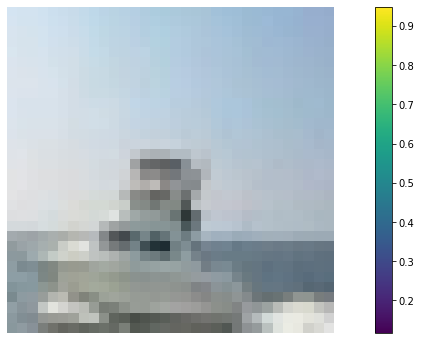

In [10]:
# 데이터 시각화 확인

# mx = train_x[100].max()                     
# mn = train_x[100].min()
# plt.imshow((train_x[100]-mn)/(mx-mn))       
plt.imshow((train_x[100]+1)/2)              # reverse of normalization

plt.colorbar()                              # 오른쪽에 픽셀값에 따른 색 표시
plt.axis('off')                             # 축 제거

plt.show()

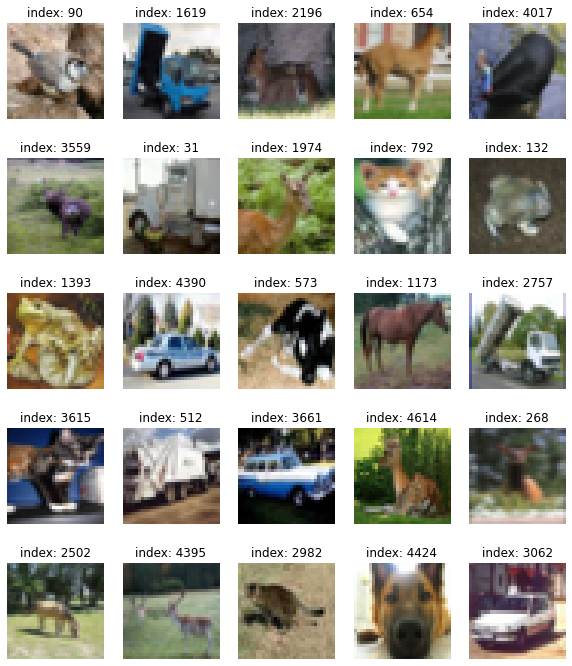

In [ ]:
# 랜덤 25개 보기

plt.figure(figsize=(10, 12))

for i in range(25):
    plt.subplot(5, 5, i+1)
    random_index = np.random.randint(1, 5000)

    # mx = train_x[random_index].max()
    # mn = train_x[random_index].min()
    # plt.imshow((train_x[random_index]-mn)/(mx-mn))
    plt.imshow((train_x[random_index]+1)/2)              # reverse of normalization


    plt.title(f'index: {random_index}')
    plt.axis('off')

plt.show()

In [30]:
# 미니배치 데이터셋을 구성

train_dataset = tf.data.Dataset.from_tensor_slices(train_x).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

## STEP 3. 생성자 모델 구현하기


- (32, 32, 3)의 shape를 가진 이미지를 생성하는 생성자 모델 구현 함수를 작성해 봅시다.   (함수정의 목록에 저장)
- noise = tf.random.normal([1, 100])로 생성된 랜덤 노이즈를 입력으로 하여 방금 구현한 생성자로 랜덤 이미지를 생성해 봅시다.  
- 생성된 랜덤 이미지가 생성자 출력 규격에 잘 맞는지 확인해 봅시다.

In [ ]:
# 생성자 모델 요약 : 랜덤 이미지를 바탕으로 (32,32,3) 이미지 생성
generator = make_generator_model()
generator.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2 (Dense)             (None, 16384)             1638400   
                                                                 
 batch_normalization_5 (Batc  (None, 16384)            65536     
 hNormalization)                                                 
                                                                 
 leaky_re_lu_2 (LeakyReLU)   (None, 16384)             0         
                                                                 
 reshape_1 (Reshape)         (None, 8, 8, 256)         0         
                                                                 
 conv2d_transpose_2 (Conv2DT  (None, 8, 8, 128)        819200    
 ranspose)                                                       
                                                                 
 batch_normalization_6 (Batc  (None, 8, 8, 128)       

In [ ]:
# 랜덤 이미지 생성
noise = tf.random.normal([1, 100])
generated_image = generator(noise, training=False)
generated_image.shape                    # 이미지 크기 확인 (32,32,3)

TensorShape([1, 32, 32, 3])

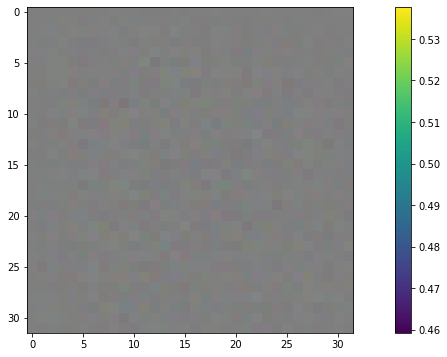

In [ ]:
# 랜덤 생성 이미지 출력
np_config.enable_numpy_behavior()           # tensorflow 객체에서도 numpy 메서드 사용가능하게 하는 함수

# mx = generated_image[0].max()
# mn = generated_image[0].min()
# plt.imshow((generated_image[0]-mn)/(mx-mn))  # 다시 정규화 시킴. : warning 발생 방지
plt.imshow((generated_image[0]+1)/2)  # 다시 정규화 시킴. : warning 발생 방지

plt.colorbar()
plt.show()

## STEP 4. 판별자 모델 구현하기


- (32, 32, 3)의 이미지를 입력으로 받아 1dim을 판별결과를 출력하는 판별자 모델 구현 함수를 작성해 봅시다. ( 함수정의에 포함)
- 위 STEP 2에서 생성한 랜덤 이미지를 판별자 모델이 판별한 결과값을 확인해 봅시다.

In [ ]:
# 판별자 모델 요약 : (32,32,3) 이미지를 판별하여 T,F 출력
discriminator = make_discriminator_model()
discriminator.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 16, 16, 64)        4864      
                                                                 
 leaky_re_lu_5 (LeakyReLU)   (None, 16, 16, 64)        0         
                                                                 
 dropout (Dropout)           (None, 16, 16, 64)        0         
                                                                 
 conv2d_4 (Conv2D)           (None, 8, 8, 128)         204928    
                                                                 
 leaky_re_lu_6 (LeakyReLU)   (None, 8, 8, 128)         0         
                                                                 
 dropout_1 (Dropout)         (None, 8, 8, 128)         0         
                                                                 
 flatten_1 (Flatten)         (None, 8192)             

In [ ]:
# 일단 첫번째 생성 이미지 평가하기

decision = discriminator(generated_image, training=False)
decision             # 학습 전이므로 의미 없는 값

<tf.Tensor: shape=(1, 1), dtype=float32, numpy=array([[-0.00330963]], dtype=float32)>

## STEP 5. 손실함수와 최적화 함수 구현하기


- 생성자와 판별자의 손실함수(loss)를 구현해 봅시다. (함수정의에 포함.)

- 판별자의 출력값을 가지고 실제/생성(real/fake) 이미지 판별 정확도(accuracy)를 계산하는 함수를 구현해 봅시다. (함수정의에 포함.)

- 생성자와 판별자를 최적화하는 optimizer를 정의합니다. (함수정의에 포함)

In [ ]:
# 손실함수 0~1 정규화
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [ ]:
# optimizer - Adam
generator_optimizer = tf.keras.optimizers.Adam(0.0001)     # 생성자 학습률 0.0001
discriminator_optimizer = tf.keras.optimizers.Adam(0.001)  # 판별자 학습률 0.001

In [ ]:
# seed 정의

noise_dim = 100                                # 100개의 랜덤 값을 입력값으로 제출 
num_examples_to_generate = 16                  # example 16

seed = tf.random.normal([num_examples_to_generate, noise_dim])  # shape (16,100)  
seed.shape

TensorShape([16, 100])

## STEP 6. 훈련과정 상세 기능 구현하기


- 1개 미니배치의 훈련 과정을 처리하는 train_step() 함수를 구현해 봅시다. (함수정의에 포함)
- 16개의 고정된 seed를 입력으로 하여 훈련 과정 동안 생성한 이미지를 시각화하는 generate_and_save_images() 함수를 구현해 봅시다. (함수정의에 포함)
- 훈련 epoch마다 생성자/판별자의 loss 및 판별자의 실제/생성(real/fake) 이미지 판별 accuracy 히스토리(history)를 그래프로 시각화하는 draw_train_history() 함수를 구현해 봅시다. (함수정의에 포함)
- \training_checkpoints 디렉토리에 몇 epoch마다 모델을 저장하는 checkpoint 모듈을 설정해 봅시다.

In [ ]:
# 모델 체크 포인트 모듈 (매 epoch마다 저장)

checkpoint_dir = '/content/drive/MyDrive/Colab Notebooks/Exploration/GAN/cifar10/training_checkpoints'

checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer
                                , discriminator_optimizer=discriminator_optimizer
                                , generator=generator
                                , discriminator=discriminator
                                 )

## STEP 7. 학습 과정 진행하기


- 위 STEP 5에서 구현한 기능들을 활용하여 최소 50 epoch만큼의 모델 학습을 진행해 봅시다.
- 학습 과정에서 생성된 샘플 이미지로 만든 gif 파일을 통해 학습 진행 과정을 시각적으로 표현해 봅시다.
- 학습 과정을 담은 샘플 이미지, gif 파일, 학습 진행 그래프 이미지를 함께 제출합니다.


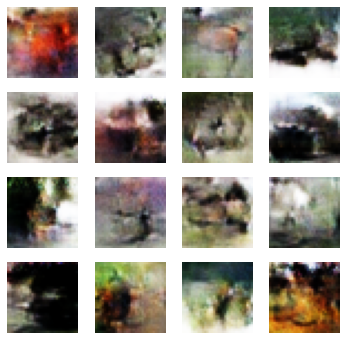

Time for training : 2061 sec


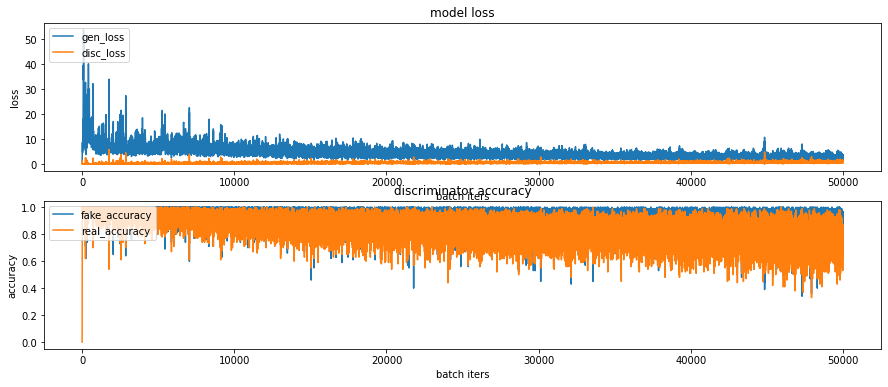

In [ ]:
save_every = 5
EPOCHS = 100                   # 100 epoch 만큼 학습

train(train_dataset, EPOCHS, save_every)

****
- (참고) 학습 과정 중 학습 epoch를 추가 진행해야 하거나, 학습한 모델을 활용하여 이미지를 생성할 필요가 생깁니다. 그럴 때마다 모델 학습을 처음부터 다시 진행한다면 시간 낭비가 될 것입니다.  

우리는 위에서 checkpoint 모듈을 이용해 모델을 저장해 둔 바 있습니다. 이를 이용해 학습해 둔 모델을 로드하면 모델 재학습이 필요 없이 이런 작업을 진행할 수 있습니다.  

아래는 checkpoint 모듈을 활용하여 모델을 로드하는 예시입니다.

In [ ]:
# # checkpoint 모듈 로드

# checkpoint_dir = '/content/drive/MyDrive/Colab Notebooks/Exploration/GAN/cifar10/training_checkpoints'

# latest = tf.train.latest_checkpoint(checkpoint_dir)
# checkpoint.restore(latest)

# generator = checkpoint.generator
# discriminator = checkpoint.discriminator

# 로드한 모델이 정상적으로 이미지를 생성하는지 확인해 봅니다. 
# noise = tf.random.normal([1, 100])
# generated_image = generator(noise, training=False)

# np_generated = generated_image.numpy()
# np_generated = (np_generated * 127.5) + 127.5   # reverse of normalization
# np_generated = np_generated.astype(int)
# plt.imshow(np_generated[0])
# plt.show()  # 정상적으로 모델이 로드되었다면 랜덤 이미지가 아니라 CIFAR-10 이미지가 그려질 것입니다.

****

In [ ]:
# 시각화

anim_file = '/content/drive/MyDrive/Colab Notebooks/Exploration/GAN/cifar10/cifar10_dcgan.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
    filenames = glob.glob('/content/drive/MyDrive/Colab Notebooks/Exploration/GAN/cifar10/generated_samples/sample*.png')
    filenames = sorted(filenames)
    last = -1
    for i, filename in enumerate(filenames):
        frame = 2*(i**0.5)
        if round(frame) > round(last):
            last = frame
        else:
            continue
        image = imageio.imread(filename)
        writer.append_data(image)

    image = imageio.imread(filename)
    writer.append_data(image)

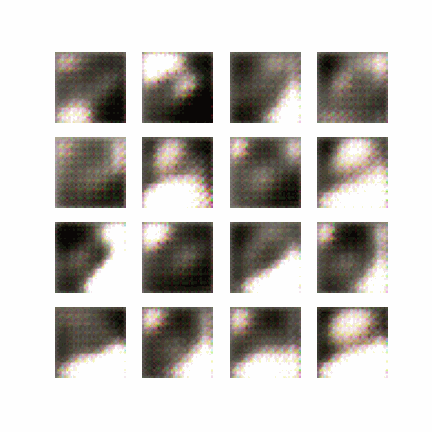

## STEP 8. (optional) GAN 훈련 과정 개선하기


- STEP 6을 진행하면서 생성된 샘플 이미지, 학습 과정 그래프 등을 통해 이전 
훈련 과정의 문제점을 분석해 봅시다.
- 모델구조 또는 학습 과정을 개선한 내역과 그 결과(샘플 이미지, 학습 과정 그래프 포함)를 함께 제출합니다.
- (참고) 아래 언급된 페이지들에서 개선을 위한 아이디어를 얻을 수 있을 것입니다.  

1. https://github.com/soumith/ganhacks  
2. https://towardsdatascience.com/10-lessons-i-learned-training-generative-adversarial-networks-gans-for-a-year-c9071159628  
3. https://machinelearningmastery.com/how-to-train-stable-generative-adversarial-networks/  
4. https://papers.nips.cc/paper/6125-improved-techniques-for-training-gans.pdf  


#### 문제점 분석

|학습후 이미지|학습 그래프 |
|--|--|
|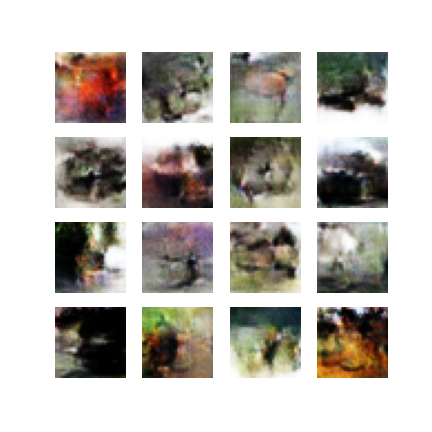|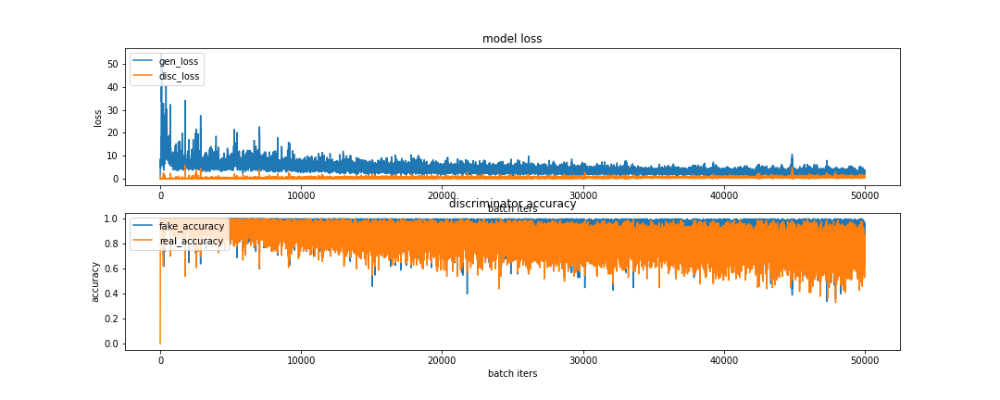|

- 최종 샘플 이미지를 살펴보면, 무엇을 그렸는지 얼핏 보이는 것도 있지만 대부분은 확인할 수 없는 그림들이 많습니다. 
- 학습과정 그래프에서 판별자 손실값이 0.5를 향해 가지만 계속 요동치는 것을 볼 수 있으며, 정확도 또한 0.5와 1.0 사이를 크게 오르 내리고 있는 모습입니다. 
- 현재의 모델로는 더이상 에폭을 증가시켜도 원하는 결과를 얻을 수 없다고 판단하여 모델 수정에 집중해 보겠습니다.

## 모델 개선 방안

다음 도표에서 보는 것과 같이 DCGAN은 다양한 방법으로 성능을 개선해 왔다고 하는데 이 중 LSGAN을 구현해 보도록 노력해 보겠습니다.

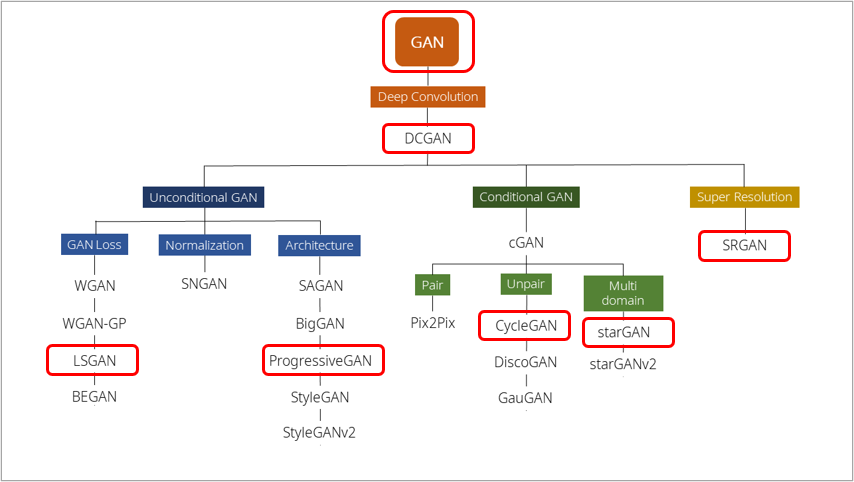


- DCGAN: 얀르쿤이 GAN을 낳았다면 Facebook은 DCGAN을 통해 모든 후속연구가 이어질 수 있도록 키운 모델

- LSGAN: 기존 GAN에 적용된 Loss의 수식을 Least Square loss로 바꾸어 성능 향상을 도모한 모델

- PGGAN: 기존 모델과 달리 점진적으로 학습하여 1024x1024의 고화질 이미지 생성을 가능하게 한 모델

- CycleGAN: 역함수 개념과 순환일관성 손실 함수를 이용해 특정 이미지의 화풍을 다른 이미지에 적용할 수 있게 한 모델

- StarGAN: 단일 생성자/판별자로 Domain Transfer가 가능하도록 만든 모델

- SRGAN: GAN 모델의 인지적 해상도를 높여 고화질 이미지 생성을 가능하게 한 모델  
  
출처 : https://roytravel.tistory.com/109



### LSGAN

LSGAN은 loss function을 부분을 BinaryCrossentropy에서 Least Square loss로 개선한 모델입니다.  
출처 : https://machinelearningmastery.com/least-squares-generative-adversarial-network/

이는 G-loss, D-loss 등 손실함수를 MSE로 변환해 주면 구현할 수 있습니다.  
여기에 학습의 정확도를 높이기 위해 다음 몇가지를 추가로 진행했습니다.  
- batch size를 256으로 높였습니다. (배치 사이즈가 작으면 학습이 불안정해진다고 합니다. 출처 : https://sensibilityit.tistory.com/508)
- 생성자 모델에서 Conv2DTranspose 레이어를 2개 추가했습니다 (총 4개)
- 모델의 Conv2DTranspose 레이어에 kernel_initializer 초기화를 적용했습니다.
- 판별자 모델에도 Conv2DTranspose 레이어를 2개 추가했습니다.
- 각 손실함수를 BinaryCrossEntropy에서 MeanSquareError 로 변경했습니다.(LSGAN과 DCGAN의 차이점) 
- Epoch을 300 정도로 늘려서 학습량을 증가시켰습니다.

- import 및 함수, 자료 준비

In [44]:
BUFFER_SIZE = 50000        # 데이터셋 개수
BATCH_SIZE = 256          # 랜덤 배치 개수

In [45]:
# 생성자 모델 (수정 : Conv 레이어 2개 층 추가 
#											output size 2-4-8-16-32 로 증가 )
def make_generator_model():
    '''생성자, generator 모델
    노드에서 주어진 기본 모델 (fasion에 사용된 모델)'''

    # Start
    init = RandomNormal(stddev=0.02)
    model = tf.keras.Sequential()
	
    # Dense layer
    model.add(layers.Dense(2*2*512, use_bias=False, input_shape=(100,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    # Reshape layer
    model.add(layers.Reshape((2, 2, 512)))

    # Conv2DTranspose layer
    model.add(layers.Conv2DTranspose(512, kernel_size=(2, 2), strides=(1, 1), padding='same', use_bias=False, kernel_initializer=init))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    # Conv2DTranspose layer
    model.add(layers.Conv2DTranspose(256, kernel_size=(4, 4), strides=(2, 2), padding='same', use_bias=False, kernel_initializer=init))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    # Conv2DTranspose layer
    model.add(layers.Conv2DTranspose(128, kernel_size=(5, 5), strides=(2, 2), padding='same', use_bias=False, kernel_initializer=init))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    # Conv2DTranspose layer
    model.add(layers.Conv2DTranspose(64, kernel_size=(5, 5), strides=(2, 2), padding='same', use_bias=False, kernel_initializer=init))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    # Conv2DTranspose layer
    model.add(layers.Conv2DTranspose(3, kernel_size=(5, 5), strides=(2, 2), padding='same', use_bias=False, \
                                     activation='tanh'))

    return model


# 판별자 모델 (수정 : 레이어 2개층 추가)
def make_discriminator_model():
    '''판별자, discriminator 모델
    노드에서 주어진 기본 모델 (fasion에 사용된 모델)'''

    # Start
    init = RandomNormal(stddev=0.02)
    model = tf.keras.Sequential()

	
    # Conv2D Layer
    model.add(layers.Conv2D(16, (5, 5), strides=(2, 2), padding='same', input_shape=[32, 32, 3]))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    # Conv2D Layer
    model.add(layers.Conv2D(32, (5, 5), strides=(2, 2), padding='same', kernel_initializer=init))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    # Conv2D Layer
    model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', kernel_initializer=init))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    # Conv2D Layer
    model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same', kernel_initializer=init))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    # Flatten Layer
    model.add(layers.Flatten())

    # Dense Layer
    model.add(layers.Dense(1))

    return model


def generator_loss(fake_output):
    '''생성자 손실함수 (mse)'''
    return mse(tf.ones_like(fake_output), fake_output)


def discriminator_loss(real_output, fake_output):
    '''판별자 손실함수 (mse)'''
    real_loss = mse(tf.ones_like(real_output), real_output)
    fake_loss = mse(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss/2


def discriminator_accuracy(real_output, fake_output):
    '''판별자 정확도 함수'''
    real_accuracy = tf.reduce_mean(tf.cast(tf.math.greater_equal(real_output, tf.constant([0.5])), tf.float32))
    fake_accuracy = tf.reduce_mean(tf.cast(tf.math.less(fake_output, tf.constant([0.5])), tf.float32))
    return real_accuracy, fake_accuracy


@tf.function
def train_step(images):                                                  #(1) 입력데이터
    '''학습 스텝 함수'''

    noise = tf.random.normal([BATCH_SIZE, noise_dim])                    #(2) 생성자 입력 노이즈

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:  #(3) tf.GradientTape() 오픈
        generated_images = generator(noise, training=True)               #(4) generated_images 생성

        #(5) discriminator 판별
        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        #(6) loss 계산
        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

        #(7) accuracy 계산
        real_accuracy, fake_accuracy = discriminator_accuracy(real_output, fake_output) 
    
    #(8) gradient 계산
    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    #(9) 모델 학습
    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return gen_loss, disc_loss, real_accuracy, fake_accuracy              #(10) 리턴값


def train(dataset, epochs, save_every):
    ''' 학습 함수'''

    start = time.time()
    history = {'gen_loss':[], 'disc_loss':[], 'real_accuracy':[], 'fake_accuracy':[]}

    for epoch in range(epochs):
        epoch_start = time.time()
        for it, image_batch in enumerate(dataset):
            gen_loss, disc_loss, real_accuracy, fake_accuracy = train_step(image_batch)
            history['gen_loss'].append(gen_loss)
            history['disc_loss'].append(disc_loss)
            history['real_accuracy'].append(real_accuracy)
            history['fake_accuracy'].append(fake_accuracy)

            if it % 50 == 0:
                display.clear_output(wait=True)
                generate_and_save_images(generator, epoch+1, it+1, seed)
                print('Epoch {} | iter {}'.format(epoch+1, it+1))
                print('Time for epoch {} : {} sec'.format(epoch+1, int(time.time()-epoch_start)))

        if (epoch + 1) % save_every == 0:
            checkpoint.save(file_prefix=checkpoint_prefix)

        display.clear_output(wait=True)
        generate_and_save_images(generator, epochs, it, seed)
        print('Time for training : {} sec'.format(int(time.time()-start)))

        draw_train_history(history, epoch)


def generate_and_save_images(model, epoch, it, sample_seeds):
    ''' 생성 이미지를 표시하고 저장하는 함수'''

    predictions = model(sample_seeds, training=False)

    fig = plt.figure(figsize=(6, 6))
    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i+1)
        # mx = predictions[i].max()
        # mn = predictions[i].min()
        # plt.imshow(((predictions[i]-mn)/(mx-mn)))
        plt.imshow(((predictions[i]+1)/2))
        
        # plt.imshow(predictions[i])
        plt.axis('off')
   
    plt.savefig('/content/drive/MyDrive/Colab Notebooks/Exploration/GAN/cifar10/generated_samples_LS/sample_epoch_{:04d}_iter_{:03d}.png'
                .format(epoch, it))

    plt.show()


rcParams['figure.figsize'] = 15, 6                  # matlab 차트의 기본 크기를 15,6으로 지정해 줍니다.

def draw_train_history(history, epoch):
    '''loss-accuraty 히스토리 그려주는 함수'''

    # summarize history for loss  
    plt.subplot(211)  
    plt.plot(history['gen_loss'])  
    plt.plot(history['disc_loss'])  
    plt.title('model loss')
    plt.ylabel('loss')  
    plt.xlabel('batch iters')  
    plt.legend(['gen_loss', 'disc_loss'], loc='upper left')  

    # summarize history for accuracy  
    plt.subplot(212)  
    plt.plot(history['fake_accuracy'])  
    plt.plot(history['real_accuracy'])  
    plt.title('discriminator accuracy')  
    plt.ylabel('accuracy')  
    plt.xlabel('batch iters')  
    plt.legend(['fake_accuracy', 'real_accuracy'], loc='upper left')  
    
    # training_history 디렉토리에 epoch별로 그래프를 이미지 파일로 저장합니다.
    plt.savefig('/content/drive/MyDrive/Colab Notebooks/Exploration/GAN/cifar10/training_history_LS/train_history_{:04d}.png'
                .format(epoch))
    plt.show()

In [46]:
# 생성자 모델 요약 : 랜덤 이미지를 바탕으로 (32,32,3) 이미지 생성
generator = make_generator_model()
generator.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_6 (Dense)             (None, 2048)              204800    
                                                                 
 batch_normalization_15 (Bat  (None, 2048)             8192      
 chNormalization)                                                
                                                                 
 leaky_re_lu_27 (LeakyReLU)  (None, 2048)              0         
                                                                 
 reshape_3 (Reshape)         (None, 2, 2, 512)         0         
                                                                 
 conv2d_transpose_15 (Conv2D  (None, 2, 2, 512)        1048576   
 Transpose)                                                      
                                                                 
 batch_normalization_16 (Bat  (None, 2, 2, 512)       

In [47]:
# 판별자 모델 요약 : (32,32,3) 이미지를 판별하여 T,F 출력
discriminator = make_discriminator_model()
discriminator.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_12 (Conv2D)          (None, 16, 16, 16)        1216      
                                                                 
 leaky_re_lu_32 (LeakyReLU)  (None, 16, 16, 16)        0         
                                                                 
 dropout_12 (Dropout)        (None, 16, 16, 16)        0         
                                                                 
 conv2d_13 (Conv2D)          (None, 8, 8, 32)          12832     
                                                                 
 leaky_re_lu_33 (LeakyReLU)  (None, 8, 8, 32)          0         
                                                                 
 dropout_13 (Dropout)        (None, 8, 8, 32)          0         
                                                                 
 conv2d_14 (Conv2D)          (None, 4, 4, 64)         

In [48]:
# 랜덤 이미지 생성
noise = tf.random.normal([1, 100])
generated_image = generator(noise, training=False)
generated_image.shape                      # 이미지 크기 확인 (32,32,3)

TensorShape([1, 32, 32, 3])

In [49]:
# 손실함수 수정 (mse) 0~1 정규화
mse = tf.keras.losses.MeanSquaredError()

In [50]:
# optimizer - Adam
generator_optimizer = tf.keras.optimizers.Adam(0.0001)     # 생성자 학습률 0.0001
discriminator_optimizer = tf.keras.optimizers.Adam(0.001)  # 판별자 학습률 0.001

In [51]:
# seed 정의
noise_dim = 100                                # 100개의 랜덤 값을 입력값으로 제출 
num_examples_to_generate = 16                  # example 16

seed = tf.random.normal([num_examples_to_generate, noise_dim])  # shape (16,100)  
seed.shape

TensorShape([16, 100])

In [52]:
# 모델 체크 포인트 모듈 (매 epoch마다 저장)

checkpoint_dir = '/content/drive/MyDrive/Colab Notebooks/Exploration/GAN/cifar10/training_checkpoints_LS'

checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer
                                , discriminator_optimizer=discriminator_optimizer
                                , generator=generator
                                , discriminator=discriminator
                                 )

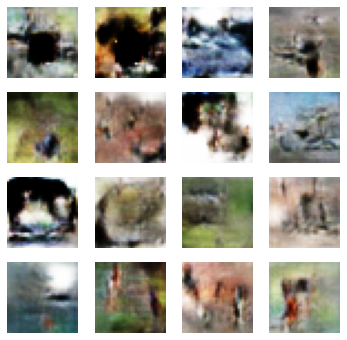

Time for training : 12393 sec


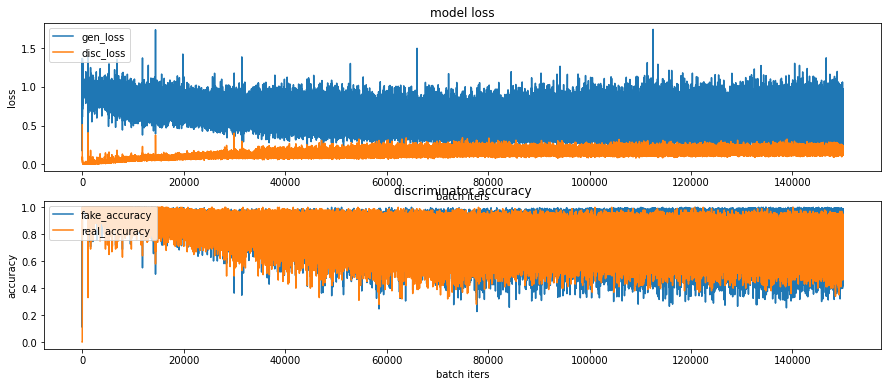

In [53]:
save_every = 10
EPOCHS = 300                  # 300 epoch 만큼 학습

train(train_dataset, EPOCHS, save_every)

### DCGAN vs. LSGAN

| |DCGAN|LSGAN|
|:--:|--:|--:|
|조건 |conv.레이어: 4층 |conv. layer: 8층|
||epoch: 100|epoch: 300|
|최종이미지|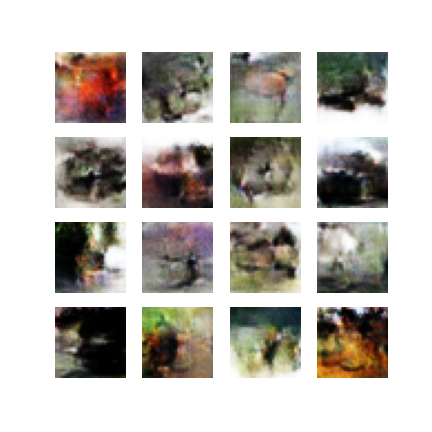   | 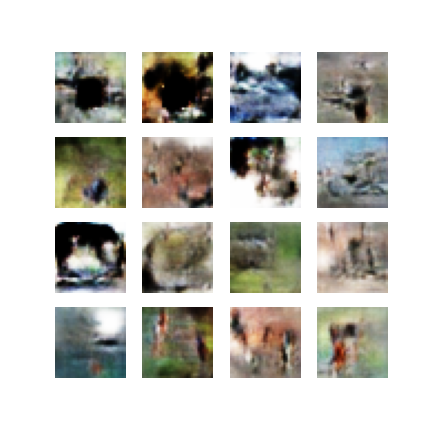  |
|학습그래프 |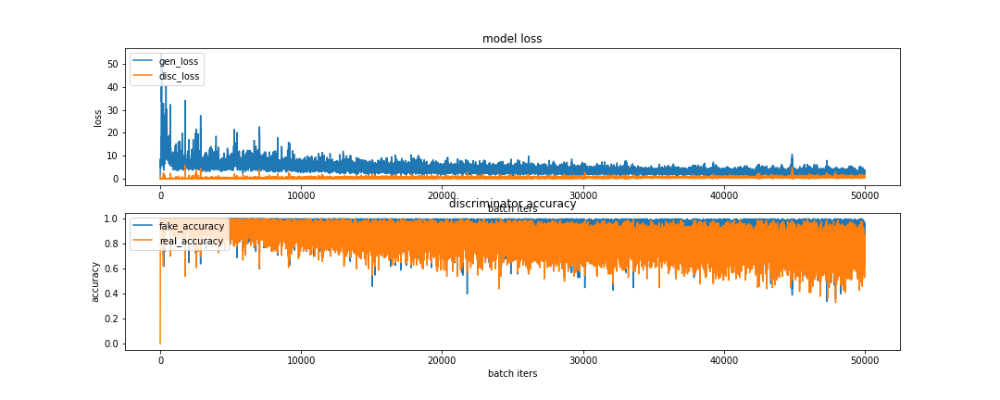   | 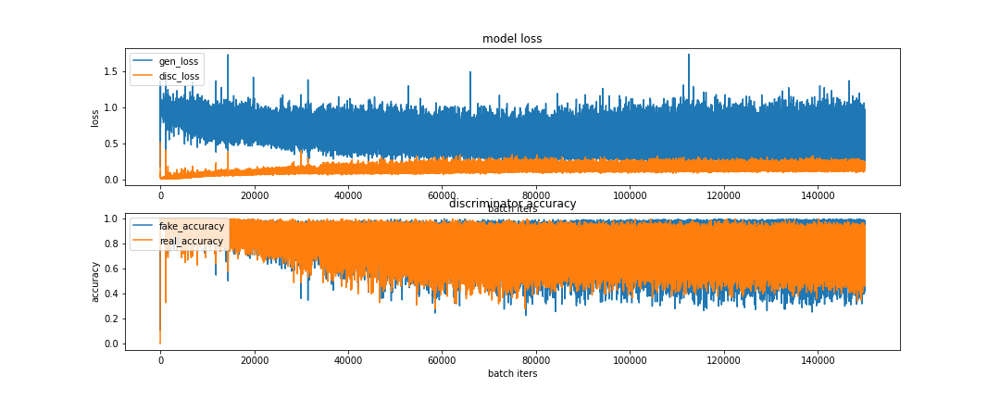  |

비교 : 학습그래프의 모양이 LSGAN의 경우 더 안정적입니다.(스케일을 보시면 LSGAN이 더 작습니다.) 이미지의 품질은 사실 layer의 차이로 직접비교할 수 없지만, 아래 그림 비교에서 보는 것처럼 LSGAN이 100 epoch 지났을 때의 이미지를 비교해 보면 LSGAN이 DCGAN보다 색감과 형태 면에서 조금(?) 더 우수한 것으로 보입니다.

100 epoch 시 이미지 비교  

|DCGAN|LSGAN|
|:--:|:--:|
|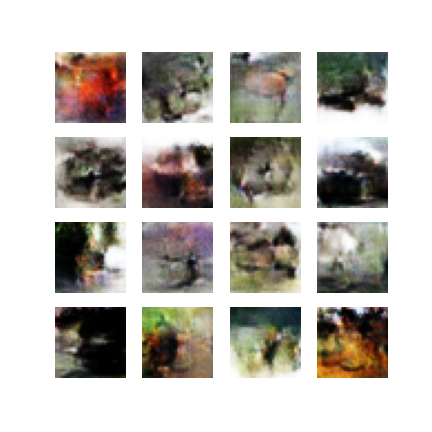    |  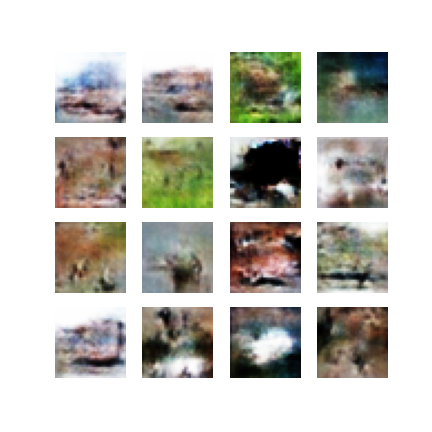  |

### 회고 

- 생성자와 판별자가 서로 경쟁하면서 가짜와 진짜를 속이고 구별하려는 학습방법이 실제 인간이 학습하는 방법과 유사한 것 같습니다. 그리고 실제로 이것을 수학적으로 구현해 내는 것을 보고 놀라웠습니다.  
- 사실 완벽한 이미지를 얻지 못해 아쉬웠지만, 이정도라도 그려낼 수 있다는 것이 신기했습니다.
- LSGAN 이외애도 수많은 모델들을 사용해 보고 싶습니다. 특히 PGGAN(Progressive Growing of GANs)을 이용하면 다음 그림처럼 '저해상도의 이미지로부터 시작해 레이어를 추가해가며 점차 해상도를 높여가는 GAN'이라고 하는데 좋은 이미지를 얻기 위해서 써 보고 싶은 모델입니다.  



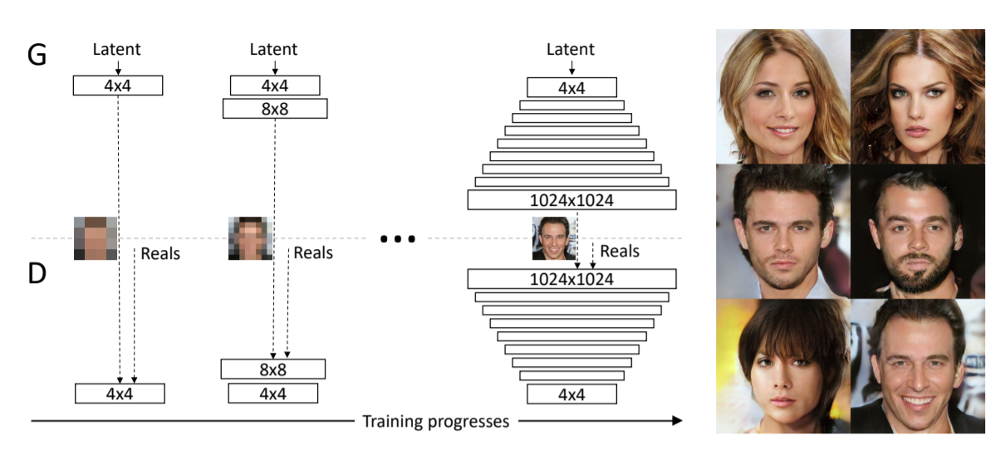

출처 : https://wiserloner.tistory.com/1196

감사합니다.